**JANGAN RUN SEMUA SEKALIGUS! BELUM URUT, MASIH COBA COBA**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!tar -xvf /content/drive/MyDrive/bajuNew8per2.tar.gz

In [ ]:
!pip install tensorflow-object-detection-api

In [ ]:
!pip install keras==2.6.* # Fix Model_builder error

In [ ]:
import os
import tensorflow as tf
import object_detection
from object_detection.utils import config_util
from object_detection.protos import pipeline_pb2
from google.protobuf import text_format
import numpy
# import tensorflow_io

In [ ]:
print(tf. __version__)
# numpy.version.version

2.8.0


In [ ]:
CUSTOM_MODEL_NAME = 'my_ssd_mobnet' 
PRETRAINED_MODEL_NAME = 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8'
PRETRAINED_MODEL_URL = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz'
TF_RECORD_SCRIPT_NAME = 'generate_tfrecord.py'
LABEL_MAP_NAME = 'label_map.pbtxt'

In [ ]:
paths = {
    'WORKSPACE_PATH': os.path.join('Tensorflow', 'workspace'),
    'SCRIPTS_PATH': os.path.join('Tensorflow','scripts'),
    'APIMODEL_PATH': os.path.join('Tensorflow','models'),
    'ANNOTATION_PATH': os.path.join('Tensorflow', 'workspace','annotations'),
    'IMAGE_PATH': os.path.join('Tensorflow', 'workspace','images'),
    'MODEL_PATH': os.path.join('Tensorflow', 'workspace','models'),
    'PRETRAINED_MODEL_PATH': os.path.join('Tensorflow', 'workspace','pre-trained-models'),
    'CHECKPOINT_PATH': os.path.join('Tensorflow', 'workspace','models',CUSTOM_MODEL_NAME), 
    'OUTPUT_PATH': os.path.join('Tensorflow', 'workspace','models',CUSTOM_MODEL_NAME, 'export'), 
    'TFJS_PATH':os.path.join('Tensorflow', 'workspace','models',CUSTOM_MODEL_NAME, 'tfjsexport'), 
    'TFLITE_PATH':os.path.join('Tensorflow', 'workspace','models',CUSTOM_MODEL_NAME, 'tfliteexport'), 
    'PROTOC_PATH':os.path.join('Tensorflow','protoc')
 }

In [ ]:
files = {
    'PIPELINE_CONFIG':os.path.join('Tensorflow', 'workspace','models', CUSTOM_MODEL_NAME, 'pipeline.config'),
    'TF_RECORD_SCRIPT': os.path.join(paths['SCRIPTS_PATH'], TF_RECORD_SCRIPT_NAME), 
    'LABELMAP': os.path.join(paths['ANNOTATION_PATH'], LABEL_MAP_NAME)
}

In [ ]:
for path in paths.values():
  !mkdir {path}

mkdir: cannot create directory ‘Tensorflow/workspace’: File exists
mkdir: cannot create directory ‘Tensorflow/scripts’: File exists
mkdir: cannot create directory ‘Tensorflow/models’: File exists
mkdir: cannot create directory ‘Tensorflow/workspace/annotations’: File exists
mkdir: cannot create directory ‘Tensorflow/workspace/images’: File exists
mkdir: cannot create directory ‘Tensorflow/workspace/models’: File exists
mkdir: cannot create directory ‘Tensorflow/workspace/pre-trained-models’: File exists
mkdir: cannot create directory ‘Tensorflow/workspace/models/my_ssd_mobnet’: File exists
mkdir: cannot create directory ‘Tensorflow/workspace/models/my_ssd_mobnet/export’: File exists
mkdir: cannot create directory ‘Tensorflow/workspace/models/my_ssd_mobnet/tfjsexport’: File exists
mkdir: cannot create directory ‘Tensorflow/workspace/models/my_ssd_mobnet/tfliteexport’: File exists
mkdir: cannot create directory ‘Tensorflow/protoc’: File exists


In [ ]:
!pip install wget
import wget

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
if not os.path.exists(os.path.join(paths['APIMODEL_PATH'], 'research', 'object_detection')):
    !git clone https://github.com/tensorflow/models {paths['APIMODEL_PATH']}
    # !git clone https://github.com/tensorflow/models/tree/r1.13.0 {paths['APIMODEL_PATH']}

Cloning into 'Tensorflow/models'...
remote: Enumerating objects: 74196, done.
remote: Counting objects: 100% (282/282), done.
remote: Compressing objects: 100% (156/156), done.
remote: Total 74196 (delta 130), reused 261 (delta 117), pack-reused 73914
Receiving objects: 100% (74196/74196), 580.22 MiB | 24.67 MiB/s, done.
Resolving deltas: 100% (52569/52569), done.


In [ ]:
%%bash
cd Tensorflow/models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
pip install .

In [ ]:
VERIFICATION_SCRIPT = os.path.join(paths['APIMODEL_PATH'], 'research', 'object_detection', 'builders', 'model_builder_tf2_test.py')
# Verify Installation
!python {VERIFICATION_SCRIPT}

Running tests under Python 3.7.13: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2022-06-06 03:46:08.876796: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:42] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
W0606 03:46:09.092932 140517467191168 model_builder.py:1102] Building experimental DeepMAC meta-arch. Some features may be omitted.
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 1.28s
I0606 03:46:09.348082 140517467191168 test_util.py:2459] time(__main__.ModelBuilderTF2Test.test_create_center_net_deepmac): 1.28s
[       OK ] ModelBuilderTF2Test.test_create_center_net_deepmac
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)
INFO:tensorflow:time(__main__.ModelBuilderTF2Test.test_create_center_net_model0 (customize_head_params=True)): 0.56s
I0606 03:46:09.913327 140517467191168 test_u

In [ ]:
wget.download(PRETRAINED_MODEL_URL)
!mv '/content/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz' {paths['PRETRAINED_MODEL_PATH']}
!cd {paths['PRETRAINED_MODEL_PATH']} && tar -zxvf {PRETRAINED_MODEL_NAME+'.tar.gz'}

ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/ckpt-0.data-00000-of-00001
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/checkpoint
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/ckpt-0.index
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/pipeline.config
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/saved_model/
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/saved_model/saved_model.pb
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/saved_model/variables/
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/saved_model/variables/variables.data-00000-of-00001
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/saved_model/variables/variables.index


In [ ]:
labels = [{'name':'BajuPangsi', 'id':1}, {'name':'BajuSurjan', 'id':2}, {'name':'BajuCak', 'id':3}]

with open(files['LABELMAP'], 'w') as f:
    for label in labels:
        f.write('item { \n')
        f.write('\tname:\'{}\'\n'.format(label['name']))
        f.write('\tid:{}\n'.format(label['id']))
        f.write('}\n')

In [ ]:
if not os.path.exists(files['TF_RECORD_SCRIPT']):
    !git clone https://github.com/nicknochnack/GenerateTFRecord {paths['SCRIPTS_PATH']}

Cloning into 'Tensorflow/scripts'...
remote: Enumerating objects: 3, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 3 (delta 0), reused 1 (delta 0), pack-reused 0
Unpacking objects: 100% (3/3), done.


In [ ]:
# FIX libpng warning: iCCP: known incorrect sRGB profile
!apt install imagemagick
# !apt remove libnvidia-common-460
# !apt-get update
# !apt-get install libmagickwand-dev libmagickcore-dev

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  imagemagick-6.q16 libnetpbm10 netpbm
Suggested packages:
  imagemagick-doc autotrace cups-bsd | lpr | lprng enscript gimp gnuplot grads
  hp2xx html2ps libwmf-bin mplayer povray radiance sane-utils texlive-base-bin
  transfig ufraw-batch
The following NEW packages will be installed:
  imagemagick imagemagick-6.q16 libnetpbm10 netpbm
0 upgraded, 4 newly installed, 0 to remove and 45 not upgraded.
Need to get 1,513 kB of archives.
After this operation, 5,204 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic-updates/main amd64 imagemagick-6.q16 amd64 8:6.9.7.4+dfsg-16ubuntu6.13 [423 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic-updates/main amd64 imagemagick amd64 8:6.9.7.4+dfsg-16ubuntu6.13 [14.2 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/main amd64 libnetpbm10 amd64 2:10.0-15.3build1 [58.0 

In [ ]:
# FIX libpng warning: iCCP: known incorrect sRGB profile
!mogrify /content/Tensorflow/workspace/images/test/*.png
!mogrify /content/Tensorflow/workspace/images/train/*.png

In [ ]:
!python {files['TF_RECORD_SCRIPT']} -x {os.path.join(paths['IMAGE_PATH'], 'train')} -l {files['LABELMAP']} -o {os.path.join(paths['ANNOTATION_PATH'], 'train.record')} 
!python {files['TF_RECORD_SCRIPT']} -x {os.path.join(paths['IMAGE_PATH'], 'test')} -l {files['LABELMAP']} -o {os.path.join(paths['ANNOTATION_PATH'], 'test.record')} 

Successfully created the TFRecord file: Tensorflow/workspace/annotations/train.record
Successfully created the TFRecord file: Tensorflow/workspace/annotations/test.record


In [ ]:
!cp {os.path.join(paths['PRETRAINED_MODEL_PATH'], PRETRAINED_MODEL_NAME, 'pipeline.config')} {os.path.join(paths['CHECKPOINT_PATH'])}

In [ ]:
!tf_upgrade_v2 \
  --infile /usr/local/lib/python3.7/dist-packages/object_detection/utils/config_util.py \
  --outfile /usr/local/lib/python3.7/dist-packages/object_detection/utils/config_util_v2.py
  

INFO line 24:0: Not upgrading symbols because `tensorflow.compat.v1` was directly imported as `tf`.
INFO line 137:7: Renamed 'tf.gfile.GFile' to 'tf.io.gfile.GFile'
INFO line 152:7: Renamed 'tf.gfile.Open' to 'tf.io.gfile.GFile'
INFO line 212:7: Renamed 'tf.gfile.GFile' to 'tf.io.gfile.GFile'
INFO line 252:7: Renamed 'tf.gfile.Open' to 'tf.io.gfile.GFile'
INFO line 253:4: Renamed 'tf.logging.info' to 'tf.compat.v1.logging.info'
INFO line 282:9: Renamed 'tf.gfile.GFile' to 'tf.io.gfile.GFile'
INFO line 288:9: Renamed 'tf.gfile.GFile' to 'tf.io.gfile.GFile'
INFO line 294:9: Renamed 'tf.gfile.GFile' to 'tf.io.gfile.GFile'
INFO line 300:9: Renamed 'tf.gfile.GFile' to 'tf.io.gfile.GFile'
INFO line 306:9: Renamed 'tf.gfile.GFile' to 'tf.io.gfile.GFile'
INFO line 552:4: Renamed 'tf.logging.info' to 'tf.compat.v1.logging.info'
INFO line 562:6: Renamed 'tf.logging.info' to 'tf.compat.v1.logging.info'
INFO line 1124:6: Renamed 'tf.logging.warning' to 'tf.compat.v1.logging.warning'
INFO line 1137

In [ ]:
from object_detection.utils import config_util_v2

In [ ]:
config = config_util_v2.get_configs_from_pipeline_file(files['PIPELINE_CONFIG'])
#fine_tune_checkpoint_version: V2

In [ ]:
config

In [ ]:
pipeline_config = pipeline_pb2.TrainEvalPipelineConfig()
with tf.io.gfile.GFile(files['PIPELINE_CONFIG'], "r") as f:                                                                                                                                                                                                                     
    proto_str = f.read()                                                                                                                                                                                                                                          
    text_format.Merge(proto_str, pipeline_config)  

In [ ]:
pipeline_config.model.ssd.num_classes = len(labels)
pipeline_config.train_config.batch_size = 16
pipeline_config.train_config.fine_tune_checkpoint = os.path.join(paths['PRETRAINED_MODEL_PATH'], PRETRAINED_MODEL_NAME, 'checkpoint', 'ckpt-0')
pipeline_config.train_config.fine_tune_checkpoint_type = "detection"
pipeline_config.train_input_reader.label_map_path= files['LABELMAP']
pipeline_config.train_input_reader.tf_record_input_reader.input_path[:] = [os.path.join(paths['ANNOTATION_PATH'], 'train.record')]
pipeline_config.eval_input_reader[0].label_map_path = files['LABELMAP']
pipeline_config.eval_input_reader[0].tf_record_input_reader.input_path[:] = [os.path.join(paths['ANNOTATION_PATH'], 'test.record')]

In [ ]:
config_text = text_format.MessageToString(pipeline_config)                                                                                                                                                                                                        
with tf.io.gfile.GFile(files['PIPELINE_CONFIG'], "wb") as f:                                                                                                                                                                                                                     
    f.write(config_text)  

In [ ]:
TRAINING_SCRIPT = os.path.join(paths['APIMODEL_PATH'], 'research', 'object_detection', 'model_main_tf2.py')

In [ ]:
# command = "python {} --model_dir={} --pipeline_config_path={} --num_train_steps=2000".format(TRAINING_SCRIPT, paths['CHECKPOINT_PATH'],files['PIPELINE_CONFIG'])
command = "python {} --model_dir={} --pipeline_config_path={} --num_train_steps=6000".format(TRAINING_SCRIPT, paths['CHECKPOINT_PATH'],files['PIPELINE_CONFIG'])

In [ ]:
print(command)

python Tensorflow/models/research/object_detection/model_main_tf2.py --model_dir=Tensorflow/workspace/models/my_ssd_mobnet --pipeline_config_path=Tensorflow/workspace/models/my_ssd_mobnet/pipeline.config --num_train_steps=6000


In [ ]:
!{command}

2022-06-06 04:02:45.279408: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:42] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I0606 04:02:45.285231 139885897508736 mirrored_strategy.py:374] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: 6000
I0606 04:02:45.288958 139885897508736 config_util.py:552] Maybe overwriting train_steps: 6000
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0606 04:02:45.289113 139885897508736 config_util.py:552] Maybe overwriting use_bfloat16: False
Instructions for updating:
rename to distribute_datasets_from_function
W0606 04:02:45.315202 139885897508736 deprecation.py:356] From /usr/local/lib/python3.7/dist-packages/object_detection/model_lib_v2.py:564: StrategyBase.experimental

In [ ]:
!apt install --allow-change-held-packages libcudnn8=8.1.0.77-1+cuda11.2 #CUDM ERROR (IMPORTANT) / DNN library is not found.

In [ ]:
# Fix cannot import name '_registerMatType' from 'cv2.cv2' error
!pip uninstall opencv-python-headless==4.5.5.64

In [ ]:
# Fix cannot import name '_registerMatType' from 'cv2.cv2' error
!pip install opencv-python-headless==4.1.2.30

In [ ]:
import os
import tensorflow as tf
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder
from object_detection.utils import config_util_v2

In [ ]:
# Load pipeline config and build a detection model
configs = config_util_v2.get_configs_from_pipeline_file(files['PIPELINE_CONFIG'])
detection_model = model_builder.build(model_config=configs['model'], is_training=False)

# Restore checkpoint
ckpt = tf.compat.v2.train.Checkpoint(model=detection_model)
ckpt.restore(os.path.join(paths['CHECKPOINT_PATH'], 'ckpt-7')).expect_partial()

@tf.function
def detect_fn(image):
    image, shapes = detection_model.preprocess(image)
    prediction_dict = detection_model.predict(image, shapes)
    detections = detection_model.postprocess(prediction_dict, shapes)
    return detections

Detect Image

In [ ]:
import cv2 
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline

In [ ]:
category_index = label_map_util.create_category_index_from_labelmap(files['LABELMAP'])

In [ ]:
IMAGE_PATH = os.path.join(paths['IMAGE_PATH'], 'test', 'Jateng 28.png')

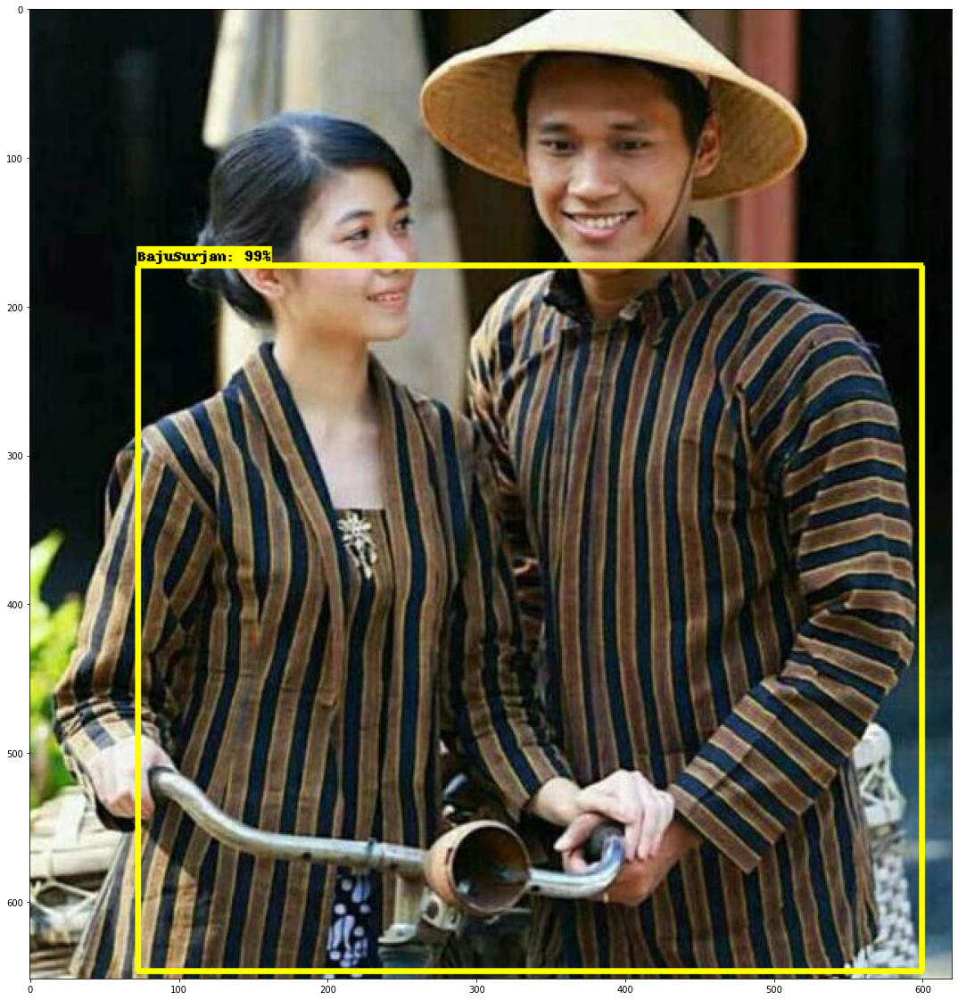

In [ ]:
img = cv2.imread(IMAGE_PATH)
image_np = np.array(img)

input_tensor = tf.convert_to_tensor(np.expand_dims(image_np, 0), dtype=tf.float32)
detections = detect_fn(input_tensor)

num_detections = int(detections.pop('num_detections'))
detections = {key: value[0, :num_detections].numpy()
              for key, value in detections.items()}
detections['num_detections'] = num_detections

# detection_classes should be ints.
detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
            image_np_with_detections,
            detections['detection_boxes'],
            detections['detection_classes']+label_id_offset,
            detections['detection_scores'],
            category_index,
            use_normalized_coordinates=True,
            max_boxes_to_draw=1,
            agnostic_mode=False)

plt.figure(figsize=(40,20)) 
plt.imshow(cv2.cvtColor(image_np_with_detections, cv2.COLOR_BGR2RGB))

# plt.show()

#label_id_offset min_score_thresh=.8,

In [ ]:
command = "python {} --model_dir={} --pipeline_config_path={} --checkpoint_dir={}".format(TRAINING_SCRIPT, paths['CHECKPOINT_PATH'],files['PIPELINE_CONFIG'], paths['CHECKPOINT_PATH'])


In [ ]:
!{command}

W0606 04:46:25.904611 140373869647744 model_lib_v2.py:1090] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: None
I0606 04:46:25.904851 140373869647744 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0606 04:46:25.904946 140373869647744 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I0606 04:46:25.905028 140373869647744 config_util.py:552] Maybe overwriting eval_num_epochs: 1
W0606 04:46:25.905139 140373869647744 model_lib_v2.py:1110] Expected number of evaluation epochs is 1, but instead encountered `eval_on_train_input_config.num_epochs` = 0. Overwriting `num_epochs` to 1.
2022-06-06 04:46:26.722977: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:42] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config 

In [ ]:
!pip install tensorboard

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir /content/Tensorflow/workspace/models/my_ssd_mobnet/eval
# %tensorboard --logdir /content/Tensorflow/workspace/models/my_ssd_mobnet/train

<IPython.core.display.Javascript object>

In [ ]:
FREEZE_SCRIPT = os.path.join(paths['APIMODEL_PATH'], 'research', 'object_detection', 'exporter_main_v2.py ')

In [ ]:
command = "python {} --input_type=image_tensor --pipeline_config_path={} --trained_checkpoint_dir={} --output_directory={}".format(FREEZE_SCRIPT ,files['PIPELINE_CONFIG'], paths['CHECKPOINT_PATH'], paths['OUTPUT_PATH'])

In [ ]:
print(command)

python Tensorflow/models/research/object_detection/exporter_main_v2.py  --input_type=image_tensor --pipeline_config_path=Tensorflow/workspace/models/my_ssd_mobnet/pipeline.config --trained_checkpoint_dir=Tensorflow/workspace/models/my_ssd_mobnet --output_directory=Tensorflow/workspace/models/my_ssd_mobnet/export


In [ ]:
!{command}

2022-06-06 04:49:50.842347: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:42] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
W0606 04:49:50.974546 139996326451072 deprecation.py:628] From /usr/local/lib/python3.7/dist-packages/tensorflow/python/autograph/impl/api.py:458: calling map_fn_v2 (from tensorflow.python.ops.map_fn) with back_prop=False is deprecated and will be removed in a future version.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
INFO:tensorflow:Assets written to: 

In [ ]:
!pip install tensorflowjs

In [ ]:
command = "tensorflowjs_converter --input_format=tf_saved_model --output_node_names='detection_boxes,detection_classes,detection_features,detection_multiclass_scores,detection_scores,num_detections,raw_detection_boxes,raw_detection_scores' --output_format=tfjs_graph_model --signature_name=serving_default {} {}".format(os.path.join(paths['OUTPUT_PATH'], 'saved_model'), paths['TFJS_PATH'])

In [ ]:
print(command)

tensorflowjs_converter --input_format=tf_saved_model --output_node_names='detection_boxes,detection_classes,detection_features,detection_multiclass_scores,detection_scores,num_detections,raw_detection_boxes,raw_detection_scores' --output_format=tfjs_graph_model --signature_name=serving_default Tensorflow/workspace/models/my_ssd_mobnet/export/saved_model Tensorflow/workspace/models/my_ssd_mobnet/tfjsexport


In [ ]:
!{command}

In [ ]:
TFLITE_SCRIPT = os.path.join(paths['APIMODEL_PATH'], 'research', 'object_detection', 'export_tflite_graph_tf2.py ')

In [ ]:
command = "python {} --pipeline_config_path={} --trained_checkpoint_dir={} --output_directory={}".format(TFLITE_SCRIPT ,files['PIPELINE_CONFIG'], paths['CHECKPOINT_PATH'], paths['TFLITE_PATH'])

In [ ]:
!{command}

2022-06-06 05:02:38.711075: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:42] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Assets written to: Tensorflow/workspace/models/my_ssd_mobnet/tfliteexport/saved_model/assets
I0606 05:02:52.770946 139890843699072 builder_impl.py:780] Assets written to: Tensorflow/workspace/models/my_ssd_mobnet/tfliteexport/saved_model/assets


In [ ]:
FROZEN_TFLITE_PATH = os.path.join(paths['TFLITE_PATH'], 'saved_model')
TFLITE_MODEL = os.path.join(paths['TFLITE_PATH'], 'saved_model', 'detect.tflite')

In [ ]:
command = "tflite_convert \
--saved_model_dir={} \
--output_file={} \
--input_shapes=1,300,300,3 \
--input_arrays=normalized_input_image_tensor \
--output_arrays='TFLite_Detection_PostProcess','TFLite_Detection_PostProcess:1','TFLite_Detection_PostProcess:2','TFLite_Detection_PostProcess:3' \
--inference_type=FLOAT \
--allow_custom_ops".format(FROZEN_TFLITE_PATH, TFLITE_MODEL, )

In [ ]:
!{command}

2022-06-06 05:04:19.630921: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:42] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
2022-06-06 05:04:24.548756: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:362] Ignored output_format.
2022-06-06 05:04:24.548815: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:365] Ignored drop_control_dependency.
Estimated count of arithmetic ops: 1.706 G  ops, equivalently 0.853 G  MACs


In [ ]:
!tar -czf /content paths['TFJS_PATH']

In [ ]:
!zip -r /content/savedmodel_tflite.zip /content/Tensorflow/workspace/models/my_ssd_mobnet/tfliteexport

  adding: content/Tensorflow/workspace/models/my_ssd_mobnet/tfliteexport/ (stored 0%)
  adding: content/Tensorflow/workspace/models/my_ssd_mobnet/tfliteexport/saved_model/ (stored 0%)
  adding: content/Tensorflow/workspace/models/my_ssd_mobnet/tfliteexport/saved_model/detect.tflite (deflated 9%)
  adding: content/Tensorflow/workspace/models/my_ssd_mobnet/tfliteexport/saved_model/saved_model.pb (deflated 91%)
  adding: content/Tensorflow/workspace/models/my_ssd_mobnet/tfliteexport/saved_model/assets/ (stored 0%)
  adding: content/Tensorflow/workspace/models/my_ssd_mobnet/tfliteexport/saved_model/variables/ (stored 0%)
  adding: content/Tensorflow/workspace/models/my_ssd_mobnet/tfliteexport/saved_model/variables/variables.data-00000-of-00001 (deflated 8%)
  adding: content/Tensorflow/workspace/models/my_ssd_mobnet/tfliteexport/saved_model/variables/variables.index (deflated 80%)
